In [1]:
# Load MARVEL package
suppressMessages(library(MARVEL))

# Load adjunct packages for selected MARVEL features
# General data processing, plotting
suppressMessages(library(ggnewscale))
suppressMessages(library(ggrepel))
suppressMessages(library(reshape2))
suppressMessages(library(plyr))
suppressMessages(library(stringr))
suppressMessages(library(textclean))

# Gene ontology analysis
suppressMessages(library(AnnotationDbi))
suppressMessages(library(clusterProfiler))
suppressMessages(library(org.Hs.eg.db))
suppressMessages(library(org.Mm.eg.db))

# ad hoc gene candidate gene analysis
suppressMessages(library(gtools))

# Visualising splice junction location
suppressMessages(library(GenomicRanges))
suppressMessages(library(IRanges))
suppressMessages(library(S4Vectors))
suppressMessages(library(wiggleplotr))

# Load adjunct packages for this tutorial
suppressMessages(library(Matrix))
suppressMessages(library(data.table))
suppressMessages(library(ggplot2))
suppressMessages(library(gridExtra))

In [2]:
indir <- "MARVEL"

In [3]:
df.gene.norm <- t(readMM(paste0(indir, "/gene_norm.mtx")))
df.gene.norm[df.gene.norm[,1] !=0,][1:5,1:5]

5 x 5 sparse Matrix of class "dgTMatrix"
                                                      
[1,] 1.0118529 0.3646905 1.0851547 2.6571383 0.2704293
[2,] 0.5059265 0.7293810 0.8138660 1.9928537 2.1634342
[3,] 0.2529632 0.3646905 0.9495103 1.3285692 2.1634342
[4,] 1.7707426 1.0940715 1.3564433 1.9928537 2.1634342
[5,] 0.7588897 0.3646905 0.4069330 0.6642846 1.0817171

In [4]:
df.pheno <- read.table(paste0(indir, "/pheno.tsv"), sep="\t", header=TRUE, stringsAsFactors=FALSE)
colnames(df.pheno)[colnames(df.pheno) == "X"] <- "cell.id"

head(df.pheno)

,cell.id,sample,sample_type,barcode,well_position,well_row,well_column,cell_type,n_genes_by_counts,log1p_n_genes_by_counts,⋯,log1p_total_counts_rRNA,pct_counts_rRNA,total_counts_lncRNA,log1p_total_counts_lncRNA,pct_counts_lncRNA,n_genes,doublet_score,predicted_doublet,sample_group,facs_day
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<dbl>,⋯,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<chr>,<int>,<chr>
1,AAACAGGC_combined_5,combined_5,combined,AAACAGGC,H18,H,18,mESC,5196,8.555837,⋯,4.897840,0.8043058,596,6.391917,3.604257,5180,0.12442396,False,5,B
2,AAAGCGGA_combined_5,combined_5,combined,AAAGCGGA,P12,P,12,mESC,4327,8.372861,⋯,4.859812,1.1158574,385,5.955837,3.356290,4308,0.07317073,False,5,B
3,AAAGGCTG_combined_5,combined_5,combined,AAAGGCTG,O10,O,10,2CLC,7465,8.918115,⋯,4.442651,0.2723735,1036,6.944087,3.359274,7413,0.15555556,True,5,B
4,AACACGCA_combined_5,combined_5,combined,AACACGCA,L20,L,20,mESC,3128,8.048469,⋯,5.176150,2.7936508,225,5.420535,3.571429,3107,0.07317073,False,5,B
5,AACCCAAC_combined_5,combined_5,combined,AACCCAAC,O15,O,15,mESC,4976,8.512583,⋯,4.919981,0.8792345,582,6.368187,3.762607,4950,0.12442396,False,5,B
6,AACCGCTT_combined_5,combined_5,combined,AACCGCTT,I13,I,13,mESC,4239,8.352319,⋯,5.347108,1.7953784,325,5.786897,2.791856,4221,0.07317073,False,5,B


In [5]:
df.genes <- read.table(paste0(indir, "/genes.tsv"), sep="\t", header=TRUE, stringsAsFactors=FALSE)
colnames(df.genes)[colnames(df.genes) == "gene_symbol"] <- "gene_short_name"
head(df.genes)

,gene_name,gene_ids,feature_types,gene_short_name,gene_versions,gene_type,mt,rRNA,lncRNA,n_cells_by_counts,⋯,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<dbl>,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<chr>
1,ENSMUSG00000144196,ENSMUSG00000144196.1,Gene Expression,ENSMUSG00000144196,ENSMUSG00000144196.1,lncRNA,False,False,True,135,⋯,98.90137,153,5.036953,135,True,0.016675276,-0.02633415,0.7181745,5,False
2,MERVL-INT:TE,MERVL-int,Gene Expression,MERVL-int:TE,MERVL-int,transposable_element,False,False,False,9841,⋯,19.91374,192296,12.166796,9841,True,2.923632822,3.82590787,1.3508959,10,True
3,MT2_MM:TE,MT2_Mm,Gene Expression,MT2_Mm:TE,MT2_Mm,transposable_element,False,False,False,7632,⋯,37.89062,89266,11.399387,7632,True,2.254788757,3.31027406,1.5744910,9,False
4,RLTR51A_MM:TE,RLTR51A_Mm,Gene Expression,RLTR51A_Mm:TE,RLTR51A_Mm,transposable_element,False,False,False,63,⋯,99.48730,67,4.219508,63,False,0.003150455,-0.65863165,-0.1030272,1,False
5,B3A:TE,B3A,Gene Expression,B3A:TE,B3A,transposable_element,False,False,False,4619,⋯,62.41048,14325,9.569831,4619,False,0.466928293,0.30263457,-0.2343764,1,False
6,RSINE1:TE,RSINE1,Gene Expression,RSINE1:TE,RSINE1,transposable_element,False,False,False,1562,⋯,87.28841,3512,8.164226,1562,False,0.106649021,-0.30393208,-0.1143842,1,False


In [6]:
df.gene.count <- t(readMM(paste0(indir, "/gene_count.mtx")))
df.gene.count[df.gene.count[,1] !=0,][1:5,1:5]

5 x 5 sparse Matrix of class "dgTMatrix"
               
[1,] 4 1  8 4 1
[2,] 2 2  6 3 8
[3,] 1 1  7 2 8
[4,] 7 3 10 3 8
[5,] 3 1  3 1 4

In [7]:
df.sj.count <- t(readMM(paste0(indir, "/sj_count.mtx")))
df.sj.count[df.sj.count[,1] !=0,][1:5,1:5]

5 x 5 sparse Matrix of class "dgTMatrix"
                 
[1,]  1 .  2 .  .
[2,]  1 1  . .  1
[3,]  1 .  2 .  2
[4,]  1 .  3 .  1
[5,] 21 3 22 3 18

In [8]:
df.sj <- read.table(paste0(indir, "/sj.tsv"), sep="\t", header=TRUE, stringsAsFactors=FALSE)
colnames(df.sj)[colnames(df.sj) == "X"] <- "locstring"
df.sj$chr <- sapply(strsplit(df.sj$locstring, ":"), "[", 1)
df.sj$coord.intron <- paste0(df.sj$chr, ":", df.sj$start, ":", df.sj$end)
# Prefix coord.intron with "chr" if it doesn't already have it
df.sj$coord.intron <- ifelse(!grepl("^chr", df.sj$coord.intron), paste0("chr", df.sj$coord.intron), df.sj$coord.intron)
head(df.sj)

,locstring,start,end,strand,motif,annotated,chr,coord.intron
,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr1:4844740-4847747:-,4844740,4847747,-,CT/AC,Yes,chr1,chr1:4844740:4847747
2,chr1:4847025-4847747:-,4847025,4847747,-,CT/AC,Yes,chr1,chr1:4847025:4847747
3,chr1:4847872-4852790:-,4847872,4852790,-,CT/AC,Yes,chr1,chr1:4847872:4852790
4,chr1:4852957-4854173:-,4852957,4854173,-,CT/AC,Yes,chr1,chr1:4852957:4854173
5,chr1:4898873-4900490:+,4898873,4900490,+,GT/AG,Yes,chr1,chr1:4898873:4900490
6,chr1:4909712-4911178:+,4909712,4911178,+,GT/AG,Yes,chr1,chr1:4909712:4911178


In [9]:
gtf <- as.data.frame(fread("../scribornaseq/run/results/_refgenome/gtf.gtf", sep="\t", header=FALSE, stringsAsFactors=FALSE))
# Add chr prefix to all rows where V1 does not start with "chr"
gtf$V1 <- ifelse(!grepl("^chr", gtf$V1), paste0("chr", gtf$V1), gtf$V1)
head(gtf)

,V1,V2,V3,V4,V5,V6,V7,V8,V9
,<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>,<chr>
1,chrGL456210.1,HAVANA,exon,631,1147,.,+,.,"gene_id ""ENSMUSG00000144196.1""; transcript_id ""ENSMUST00000381699.1""; gene_type ""lncRNA""; gene_name ""ENSMUSG00000144196""; transcript_type ""lncRNA""; transcript_name ""ENSMUST00000381699""; exon_number 1; exon_id ""ENSMUSE00001750442.1""; level 2; tag ""basic""; tag ""TAGENE"";"
2,chrGL456210.1,HAVANA,gene,631,156515,.,+,.,"gene_id ""ENSMUSG00000144196.1""; gene_type ""lncRNA""; gene_name ""ENSMUSG00000144196""; level 2;"
3,chrGL456210.1,HAVANA,transcript,631,136698,.,+,.,"gene_id ""ENSMUSG00000144196.1""; transcript_id ""ENSMUST00000381699.1""; gene_type ""lncRNA""; gene_name ""ENSMUSG00000144196""; transcript_type ""lncRNA""; transcript_name ""ENSMUST00000381699""; level 2; tag ""basic""; tag ""TAGENE"";"
4,chrGL456210.1,HAVANA,exon,1018,1147,.,+,.,"gene_id ""ENSMUSG00000144196.1""; transcript_id ""ENSMUST00000381700.1""; gene_type ""lncRNA""; gene_name ""ENSMUSG00000144196""; transcript_type ""lncRNA""; transcript_name ""ENSMUST00000381700""; exon_number 1; exon_id ""ENSMUSE00001750426.1""; level 2; tag ""TAGENE"";"
5,chrGL456210.1,HAVANA,transcript,1018,136686,.,+,.,"gene_id ""ENSMUSG00000144196.1""; transcript_id ""ENSMUST00000381700.1""; gene_type ""lncRNA""; gene_name ""ENSMUSG00000144196""; transcript_type ""lncRNA""; transcript_name ""ENSMUST00000381700""; level 2; tag ""TAGENE"";"
6,chrGL456210.1,UCSC_rmsk,exon,1275,1456,1585,+,.,"gene_id ""MERVL-int""; transcript_id ""MERVL-int_dup2039""; family_id ""ERVL""; class_id ""LTR""; gene_name ""MERVL-int:TE"";"


In [10]:
df.umap <- read.table(paste0(indir, "/umap.tsv"), sep="\t", header=TRUE, stringsAsFactors=FALSE)
colnames(df.umap) <- c("cell.id", "x", "y")
head(df.umap)

,cell.id,x,y
,<chr>,<dbl>,<dbl>
1,AAACAGGC_combined_5,1.552624,12.190267
2,AAAGCGGA_combined_5,1.387908,8.696829
3,AAAGGCTG_combined_5,3.149166,11.693304
4,AACACGCA_combined_5,2.345846,10.873199
5,AACCCAAC_combined_5,4.195780,12.637164
6,AACCGCTT_combined_5,4.671925,12.251376


In [11]:
marvel <- CreateMarvelObject.10x(gene.norm.matrix=df.gene.norm,
                                 gene.norm.pheno=df.pheno,
                                 gene.norm.feature=df.genes,
                                 gene.count.matrix=df.gene.count,
                                 gene.count.pheno=df.pheno,
                                 gene.count.feature=df.genes,
                                 sj.count.matrix=df.sj.count,
                                 sj.count.pheno=df.pheno,
                                 sj.count.feature=df.sj,
                                 pca=df.umap,
                                 gtf=gtf
                                 )

Annotating rows and columns for matrices...

Filling in slots for MARVEL object...

MARVEL object created



In [12]:
marvel <- AnnotateGenes.10x(MarvelObject=marvel)

head(marvel$gene.metadata)

29459 genes found in gene metadata

28417 genes overlapped with GTF and will be subset-ed

Gene type annotated

Gene metadata and normalised gene expression matrix updated



,gene_short_name,gene_name,gene_ids,feature_types,gene_versions,gene_type,mt,rRNA,lncRNA,n_cells_by_counts,⋯,total_counts,log1p_total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection,gene_type
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,⋯,<int>,<dbl>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
1,ENSMUSG00000144196,ENSMUSG00000144196,ENSMUSG00000144196.1,Gene Expression,ENSMUSG00000144196.1,lncRNA,False,False,True,135,⋯,153,5.036953,135,True,0.016675276,-0.02633415,0.71817446,5,False,character(0)
17,ENSMUSG00000079800,ENSMUSG00000079800,ENSMUSG00000079800.3,Gene Expression,ENSMUSG00000079800.3,protein_coding,False,False,False,48,⋯,56,4.043051,48,False,0.003435812,-0.45448072,-0.33885244,1,False,character(0)
84,ENSMUSG00000095250,ENSMUSG00000095250,ENSMUSG00000095250.2,Gene Expression,ENSMUSG00000095250.2,protein_coding,False,False,False,20,⋯,20,3.044522,20,False,0.001231310,-0.23061491,0.03963332,1,False,character(0)
86,ENSMUSG00000144204,ENSMUSG00000144204,ENSMUSG00000144204.1,Gene Expression,ENSMUSG00000144204.1,lncRNA,False,False,True,71,⋯,83,4.430817,71,False,0.008471077,-0.06516882,0.46800910,2,False,character(0)
103,ENSMUSG00000095672,ENSMUSG00000095672,ENSMUSG00000095672.2,Gene Expression,ENSMUSG00000095672.2,protein_coding,False,False,False,32,⋯,32,3.496508,32,False,0.003127357,-0.70890297,-0.30871030,2,False,character(0)
104,ENSMUSG00000079190,ENSMUSG00000079190,ENSMUSG00000079190.4,Gene Expression,ENSMUSG00000079190.4,protein_coding,False,False,False,60,⋯,63,4.158883,60,False,0.005112014,-0.37958274,0.22663054,4,False,character(0)


In [13]:
# Define arguments
gtf <- marvel$gtf
df.sj.count <- marvel$sj.count.matrix

# Example arguments
#MarvelObject <- marvel
#gtf <- MarvelObject$gtf
#df.sj.count <- MarvelObject$sj.count.matrix

#########################################################

# Create SJ metadata
message("Creating splice junction metadata...")

df <- data.frame("coord.intron"=rownames(df.sj.count), stringsAsFactors=FALSE)

. <- strsplit(rownames(df.sj.count), split=":", fixed=TRUE)
df$chr <- sapply(., function(x) {as.character(x[1])})
df$start <- sapply(., function(x) {as.character(x[2])})
df$end <- sapply(., function(x) {as.character(x[3])})

# Parse GTF
    # Track progress
    message("Parsing GTF...")
    
    # Subset exon entries
    gtf <- gtf[which(gtf$V3=="exon"), ]

    # Retrieve gene names        
    . <- strsplit(gtf$V9, split=";")
    . <- sapply(., function(x) grep("gene_name", x, value=TRUE))
    . <- gsub("gene_name", "", .)
    . <- gsub(" ", "", .)
    . <- gsub("\"", "", .)

    gtf$gene_short_name <- .

    # Convert exon coordinates to intron (to match STAR output)
    gtf$V4 <- gtf$V4 - 1
    gtf$V5 <- gtf$V5 + 1

# Check for chr prefix
logical <- grepl("chr", gtf$V1[1], fixed=TRUE)
logical

Creating splice junction metadata...

Parsing GTF...



[1] TRUE

In [14]:
# Collapse start position
    # Track progress
    message("Matching gene names with SJ start coordinates in GTF...")
                
    # Keep unique entries
    gtf.small <- gtf[, c("V1", "V5", "gene_short_name")]
    
    if(logical==FALSE) {
        
        gtf.small$chr.pos <- paste("chr", gtf$V1, ":", gtf$V5, sep="")
        
    } else if(logical==TRUE) {
        
        gtf.small$chr.pos <- paste(gtf$V1, ":", gtf$V5, sep="")
        
    }
        
    gtf.small <- gtf.small[,c("chr.pos", "gene_short_name")]
    gtf.small <- unique(gtf.small)
    
    # Collapse
    gtf.small$chr.pos <- as.factor(gtf.small$chr.pos)
    . <- by(gtf.small[,"gene_short_name"], gtf.small[,"chr.pos"], function(x) {paste(x, collapse="|")})
    gtf.small.collapsed <- data.frame("chr"=as.character(names(.)), "gene_short_name"=as.character(.), stringsAsFactors=FALSE)
    
    # Save as new object
    gtf.small.collapsed.start <- gtf.small.collapsed
    names(gtf.small.collapsed.start) <- paste(names(gtf.small.collapsed.start), ".start", sep="")

head(gtf.small.collapsed.start)

Matching gene names with SJ start coordinates in GTF...



,chr.start,gene_short_name.start
,<chr>,<chr>
1,chr1:1.03e+08,L1MdF_IV:TE
2,chr1:1.1e+07,L1_Mur2:TE
3,chr1:1.24e+08,B4:TE
4,chr1:1.54e+08,Lx5b:TE
5,chr1:1.59e+08,L1MdF_V:TE
6,chr1:1.6e+08,Lx9:TE


In [15]:
# Collapse end position
    # Track progress
    message("Matching gene names with SJ end coordinates in GTF...")
    
    # Keep unique entries
    gtf.small <- gtf[, c("V1", "V4", "gene_short_name")]
    
    if(logical==FALSE) {
    
        gtf.small$chr.pos <- paste("chr", gtf$V1, ":", gtf$V4, sep="")
    
    } else if(logical==TRUE) {
        
        gtf.small$chr.pos <- paste(gtf$V1, ":", gtf$V4, sep="")
        
    }

    gtf.small <- gtf.small[,c("chr.pos", "gene_short_name")]
    gtf.small <- unique(gtf.small)
    
    # Collapse
    gtf.small$chr.pos <- as.factor(gtf.small$chr.pos)
    . <- by(gtf.small[,"gene_short_name"], gtf.small[,"chr.pos"], function(x) {paste(x, collapse="|")})
    gtf.small.collapsed <- data.frame("chr"=as.character(names(.)), "gene_short_name"=as.character(.), stringsAsFactors=FALSE)
    
    # Save as new object
    gtf.small.collapsed.end <- gtf.small.collapsed
    names(gtf.small.collapsed.end) <- paste(names(gtf.small.collapsed.end), ".end", sep="")

head(gtf.small.collapsed.end)

Matching gene names with SJ end coordinates in GTF...



,chr.end,gene_short_name.end
,<chr>,<chr>
1,chr1:1.03e+08,L1MdF_IV:TE
2,chr1:1.05e+08,MT2A:TE
3,chr1:1.07e+08,L1MdA_VII:TE
4,chr1:1.08e+08,L1MdF_II:TE
5,chr1:1.09e+08,L1MdA_II:TE
6,chr1:1.15e+08,L1MdF_V:TE


In [16]:
# Annotate splice junctions
    # Track progress
    message("Annotating splice junctions...")
    
    # Retrieve SJ start, end coordinates
    df$chr.start <- paste(df$chr, ":", df$start, sep="")
    df$chr.end <- paste(df$chr, ":", df$end, sep="")
    #df$chr.start.end <- paste(df$chr, ":", df$start, ":", df$end, sep="")

    # Indicate id for re-ordering later
    df$id <- c(1:nrow(df))

    # Annotate SJ start,end with gene names
    #dim(gtf.small.collapsed.start) ; dim(gtf.small.collapsed.end) ; dim(df)
    df <- join(df, gtf.small.collapsed.start, by="chr.start", type="left")
    df <- join(df, gtf.small.collapsed.end, by="chr.end", type="left")
    #dim(df) ; sum(is.na(df$gene_short_name.start)) ; sum(is.na(df$gene_short_name.end))

head(df)

Annotating splice junctions...



,coord.intron,chr,start,end,chr.start,chr.end,id,gene_short_name.start,gene_short_name.end
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>
1,chr1:4844740:4847747,chr1,4844740,4847747,chr1:4844740,chr1:4847747,1,Mrpl15,Mrpl15
2,chr1:4847025:4847747,chr1,4847025,4847747,chr1:4847025,chr1:4847747,2,Mrpl15,Mrpl15
3,chr1:4847872:4852790,chr1,4847872,4852790,chr1:4847872,chr1:4852790,3,Mrpl15,Mrpl15
4,chr1:4852957:4854173,chr1,4852957,4854173,chr1:4852957,chr1:4854173,4,Mrpl15,Mrpl15
5,chr1:4898873:4900490,chr1,4898873,4900490,chr1:4898873,chr1:4900490,5,Lypla1|Gm37988,Lypla1|Gm37988
6,chr1:4909712:4911178,chr1,4909712,4911178,chr1:4909712,chr1:4911178,6,Lypla1|Gm37988,Lypla1|Gm37988


In [17]:
# Merge gene annotation
    # Create new column
    df$sj.type <- NA
    
    # Single-end record: Same gene at SJ start & end
    index.l <- !grepl("|", df$gene_short_name.start, fixed=TRUE) & !grepl("|", df$gene_short_name.end, fixed=TRUE) & !is.na(df$gene_short_name.start) & !is.na(df$gene_short_name.end) & df$gene_short_name.start==df$gene_short_name.end
    index <- which(index.l==TRUE)
    
    if(length(index) >= 1) {
        
        df$sj.type[index] <- "start_known.single.gene|end_known.single.gene|same"
        
    }
    
    # Single-end record: Different gene at SJ start & end
    index.l <- is.na(df$sj.type) & !grepl("|", df$gene_short_name.start, fixed=TRUE) & !grepl("|", df$gene_short_name.end, fixed=TRUE) & !is.na(df$gene_short_name.start) & !is.na(df$gene_short_name.end) & !df$gene_short_name.start==df$gene_short_name.end
    index <- which(index.l==TRUE)
    
    if(length(index) >= 1) {
        
        df$sj.type[index] <- "start_known.single.gene|end_known.single.gene|different"
        
    }
    
    # No record: Both sj
    index.l <- is.na(df$sj.type) & is.na(df$gene_short_name.start) & is.na(df$gene_short_name.end)
    index <- which(index.l==TRUE)
    
    if(length(index) >= 1) {
        
        df$sj.type[index] <- "start_unknown.gene|end_unknown.gene"
        
    }
                
    # No record (start SJ) + end single gene
    index.l <- is.na(df$sj.type) & is.na(df$gene_short_name.start) & !is.na(df$gene_short_name.end) & !grepl("|", df$gene_short_name.end, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_unknown.gene|end_known.single.gene"
            
    }
    
    # No record (start SJ) + end multi gene
    index.l <- is.na(df$sj.type) & is.na(df$gene_short_name.start) & !is.na(df$gene_short_name.end) & grepl("|", df$gene_short_name.end, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_unknown.gene|end_known.multi.gene"
            
    }
    
    # No record (end SJ) + start single gene
    index.l <- is.na(df$sj.type) & is.na(df$gene_short_name.end) & !is.na(df$gene_short_name.start) & !grepl("|", df$gene_short_name.start, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_known.single.gene|end_unknown.gene"
            
    }
    
    # No record (end SJ) + start multi gene
    index.l <- is.na(df$sj.type) & is.na(df$gene_short_name.end) & !is.na(df$gene_short_name.start) & grepl("|", df$gene_short_name.start, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_known.multi.gene|end_unknown.gene"
            
    }
    
    # Multiple genes start and end
    index.l <- is.na(df$sj.type) & !is.na(df$gene_short_name.end) & !is.na(df$gene_short_name.start) & grepl("|", df$gene_short_name.start, fixed=TRUE) & grepl("|", df$gene_short_name.end, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_known.multi.gene|end_known.multi.gene"
            
    }
    
    # Multiple genes start + single gene end
    index.l <- is.na(df$sj.type) & !is.na(df$gene_short_name.end) & !is.na(df$gene_short_name.start) & grepl("|", df$gene_short_name.start, fixed=TRUE) & !grepl("|", df$gene_short_name.end, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_known.multi.gene|start_known.single.gene"
            
    }

    # Multiple genes end + single gene start
    index.l <- is.na(df$sj.type) & !is.na(df$gene_short_name.end) & !is.na(df$gene_short_name.start) & !grepl("|", df$gene_short_name.start, fixed=TRUE) & grepl("|", df$gene_short_name.end, fixed=TRUE)
    index <- which(index.l==TRUE)
        
    if(length(index) >= 1) {
            
        df$sj.type[index] <- "start_known.single.gene|end_known.multi.gene"
            
    }

    # Check for missing sj annotations
    if(sum(is.na(df$sj.type)) == 0) {
        
        message("All SJ successfully annotated")
        
    } else {
        
        message("Some SJ NOT successfully annotated")
    }

# Formet input for MARVEL
df <- df[,c("coord.intron", "gene_short_name.start", "gene_short_name.end", "sj.type")]

All SJ successfully annotated



In [18]:
# Update slot
marvel$sj.metadata <- df
head(marvel$sj.metadata)

,coord.intron,gene_short_name.start,gene_short_name.end,sj.type
,<chr>,<chr>,<chr>,<chr>
1,chr1:4844740:4847747,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
2,chr1:4847025:4847747,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
3,chr1:4847872:4852790,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
4,chr1:4852957:4854173,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
5,chr1:4898873:4900490,Lypla1|Gm37988,Lypla1|Gm37988,start_known.multi.gene|end_known.multi.gene
6,chr1:4909712:4911178,Lypla1|Gm37988,Lypla1|Gm37988,start_known.multi.gene|end_known.multi.gene


In [19]:
marvel <- ValidateSJ.10x(MarvelObject=marvel)
head(marvel$sj.metadata)

6190 annotated and uniquely-mapped SJ identified

67 annotated (at one end) and uniquely-mapped SJ identified

1657 unannotated SJ identified

121 multi-mapping SJ identified



SJ metadata and SJ count matrix updated



,coord.intron,gene_short_name.start,gene_short_name.end,sj.type
,<chr>,<chr>,<chr>,<chr>
1,chr1:4844740:4847747,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
2,chr1:4847025:4847747,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
3,chr1:4847872:4852790,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
4,chr1:4852957:4854173,Mrpl15,Mrpl15,start_known.single.gene|end_known.single.gene|same
10,chr1:4962293:4963639,Tcea1,Tcea1,start_known.single.gene|end_known.single.gene|same
13,chr1:10012381:10012547,Snhg6,Snhg6,start_known.single.gene|end_known.single.gene|same


In [20]:
marvel <- CheckAlignment.10x(MarvelObject=marvel)

Matching gene list in normalised and raw (count) gene matrices...

28417 genes found in normalised gene matrix

29459 genes found in raw (count) gene matrix

28417 overlapping genes found and retained



Matching cells across normalised gene, raw (count) gene, raw (count) SJ matrices...

3119 cells found in normalised gene matrix

3119 cells found in raw (count) gene matrix

3119 cells found in raw (count) SJ matrix

3119 overlapping cells found and retained

Checking column (sample) alignment...

Sample metadata and normalised gene matrix column names MATCHED

Normalised and raw (count) gene matrix column names MATCHED

Raw (Count) gene and SJ matrix column names MATCHED

Checking row (gene names/SJ coordinates) alignment...

Gene metadata and normalised gene matrix row names MATCHED

Normalised and raw (count) gene matrix row names MATCHED

SJ metadata and raw (count) SJ matrix row names MATCHED

3119 cells and 2040 genes consisting of 6182 splice junctions included for further analysis



In [21]:
saveRDS(marvel, file="MARVEL/MARVEL.RData")

In [22]:
marvel <- readRDS("MARVEL/MARVEL.RData")

In [23]:
table(marvel$sample.metadata$cell_type)


2CLC mESC 
1563 1556 

In [24]:
# Define cell groups
    # Retrieve sample metadata
    sample.metadata <- marvel$sample.metadata
    
    # Group 1 (reference)
    index <- which(sample.metadata$cell_type=="2CLC")
    cell.ids.1 <- sample.metadata[index, "cell.id"]
    length(cell.ids.1)

[1] 1563

In [25]:
    # Group 2
    index <- which(sample.metadata$cell_type=="mESC")
    cell.ids.2 <- sample.metadata[index, "cell.id"]
    length(cell.ids.2)

[1] 1556

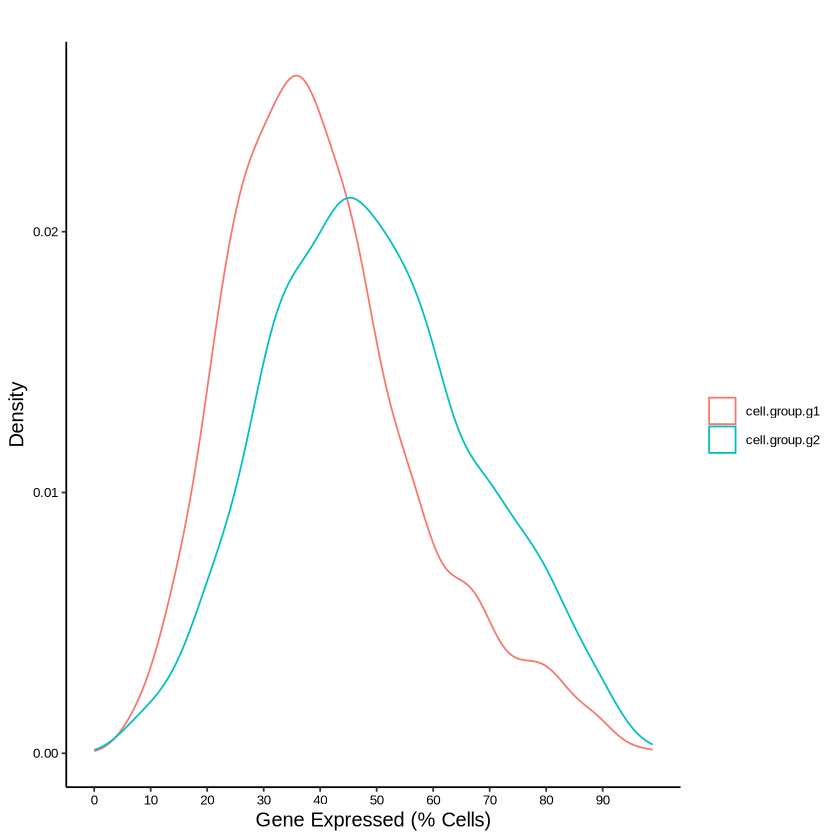

In [26]:
# Explore % of cells expressing genes
marvel <- PlotPctExprCells.Genes.10x(MarvelObject=marvel,
                                     cell.group.g1=cell.ids.1,
                                     cell.group.g2=cell.ids.2,
                                     min.pct.cells=5
                                     )

marvel$pct.cells.expr$Gene$Plot

In [27]:
head(marvel$pct.cells.expr$Gene$Data)

,cell.group,gene_short_name,n.cells.total,n.cells.expr,pct.cells.expr
,<fct>,<chr>,<int>,<dbl>,<dbl>
1,cell.group.g1,ENSMUSG00000095041,1563,565,36.15
2,cell.group.g1,Mrpl15,1563,575,36.79
3,cell.group.g1,Tcea1,1563,609,38.96
4,cell.group.g1,Snhg6,1563,425,27.19
5,cell.group.g1,Cops5,1563,431,27.58
6,cell.group.g1,Prex2,1563,601,38.45


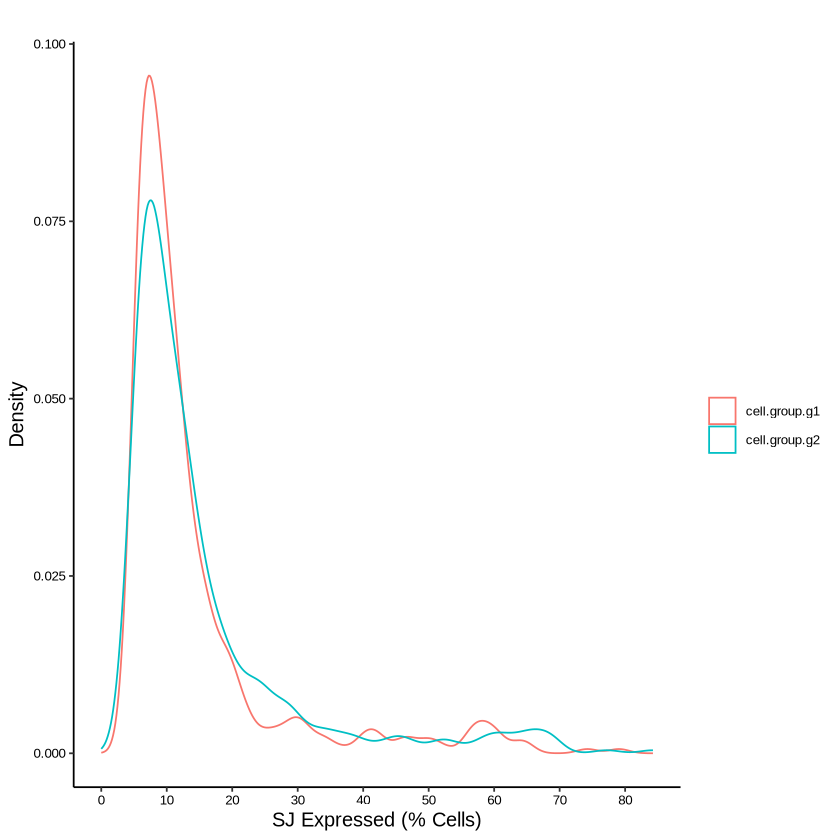

In [28]:
marvel <- PlotPctExprCells.SJ.10x(MarvelObject=marvel,
                                  cell.group.g1=cell.ids.1,
                                  cell.group.g2=cell.ids.2,
                                  min.pct.cells.genes=5,
                                  min.pct.cells.sj=5,
                                  downsample=TRUE,
                                  downsample.pct.sj=10
                                  )

marvel$pct.cells.expr$SJ$Plot

In [29]:
head(marvel$pct.cells.expr$SJ$Data)

,cell.group,coord.intron,n.cells.total,n.cells.expr,pct.cells.expr
,<fct>,<chr>,<int>,<dbl>,<dbl>
2,cell.group.g1,chr1:16172161:16172713,1563,887,56.75
3,cell.group.g1,chr1:20877107:20878944,1563,137,8.77
4,cell.group.g1,chr1:23915531:23916789,1563,128,8.19
5,cell.group.g1,chr1:34195776:34195861,1563,145,9.28
6,cell.group.g1,chr1:34268328:34281699,1563,99,6.33
7,cell.group.g1,chr1:34283596:34286729,1563,125,8.00


In [30]:
marvel <- CompareValues.SJ.10x(MarvelObject=marvel,
                               cell.group.g1=cell.ids.1,
                               cell.group.g2=cell.ids.2,
                               min.pct.cells.genes=10,
                               min.pct.cells.sj=25,
                               min.gene.norm=1.0,
                               seed=1,
                               n.iterations=100,
                               downsample=FALSE,
                               show.progress=TRUE
                               )

1563 cells from Group 1 and 1556 cells from Group 2 included



2008 genes expressed in cell group 1

2003 genes expressed in cell group 2

1990 genes expressed in BOTH cell group and retained

291 genes with mean log2(expression + 1) > 1 retained

563 SJ expressed in cell group 1

688 SJ expressed in cell group 2

690 SJ expressed in EITHER cell groups and retained

Total of 690 SJ from 174 genes included for DE analysis

Computing PSI for cell group 1...

Computing PSI for cell group 2...

Creating null distributions...



  |======================================================================| 100%

Computing P values...



In [31]:
marvel <- CompareValues.Genes.10x(MarvelObject=marvel,
                                  show.progress=FALSE
                                  )

head(marvel$DE$SJ$Table)

Performing Wilcox rank sum test...



,coord.intron,gene_short_name,n.cells.total.g1,n.cells.expr.sj.g1,pct.cells.expr.sj.g1,n.cells.expr.gene.g1,pct.cells.expr.gene.g1,sj.count.total.g1,gene.count.total.g1,psi.g1,⋯,n.cells.expr.gene.norm.g1,pct.cells.expr.gene.norm.g1,mean.expr.gene.norm.g1,n.cells.total.norm.g2,n.cells.expr.gene.norm.g2,pct.cells.expr.gene.norm.g2,mean.expr.gene.norm.g2,log2fc.gene.norm,pval.gene.norm,pval.adj.gene.norm
,<chr>,<chr>,<int>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<int>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,chr3:88228453:88228750,Cct3,1563,529,33.85,1067,68.27,1273,6003,21.21,⋯,1067,68.27,1.254523,1556,1209,77.70,1.504320,0.24979756,5.424426e-15,1.966355e-14
2,chr9:78274577:78275002,Dppa5a,1563,1012,64.75,1177,75.30,7527,11676,64.47,⋯,1177,75.30,1.789358,1556,1342,86.25,2.272101,0.48274272,1.102061e-31,2.739410e-30
3,chr9:78386141:78386239,Eef1a1,1563,1139,72.87,1536,98.27,7167,51719,13.86,⋯,1536,98.27,4.562879,1556,1538,98.84,4.500931,-0.06194799,1.395106e-06,2.924681e-06
4,chr10:111331967:111332614,Nap1l1,1563,425,27.19,1161,74.28,1089,9367,11.63,⋯,1161,74.28,1.641654,1556,1266,81.36,1.858620,0.21696590,2.754477e-08,6.476743e-08
5,chr11:33102853:33103985,Npm1,1563,809,51.76,1400,89.57,3237,20420,15.85,⋯,1400,89.57,2.760595,1556,1428,91.77,2.924837,0.16424113,8.089236e-07,1.759409e-06
6,chr11:114562683:114563090,Rpl38,1563,807,51.63,1032,66.03,5175,8484,61.00,⋯,1032,66.03,1.377819,1556,1110,71.34,1.499574,0.12175469,4.488517e-03,6.732775e-03


Warning message:
“Removed 690 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”


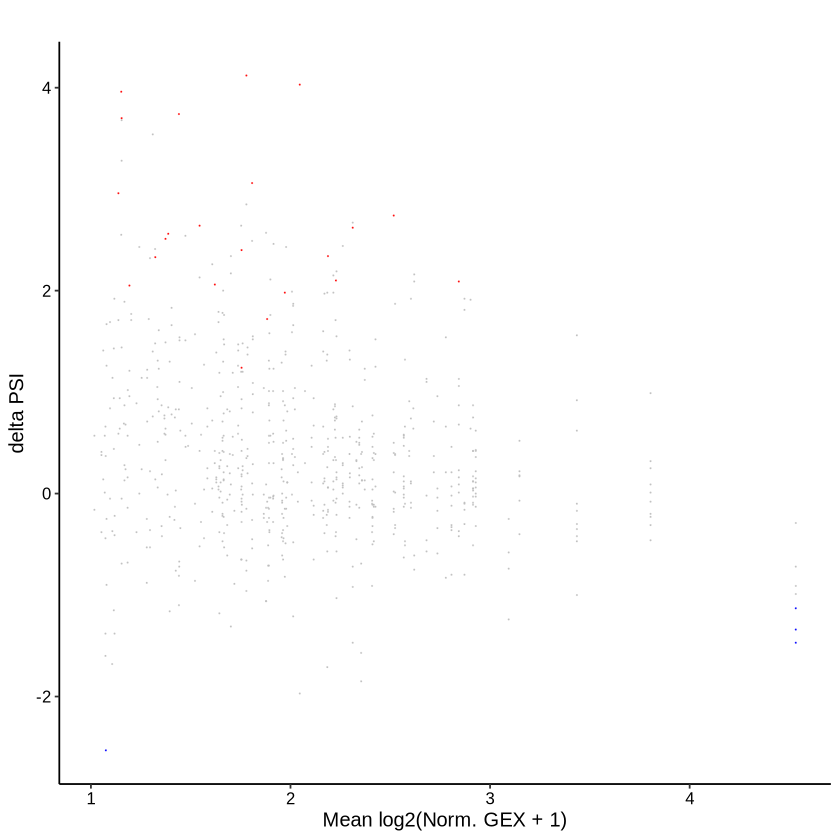

In [32]:
marvel <- PlotDEValues.SJ.10x(MarvelObject=marvel,
                              pval=0.05,
                              delta=1,
                              min.gene.norm=0,
                              anno=FALSE
                              )

marvel$DE$SJ$VolcanoPlot$SJ$Plot

In [33]:
colnames(marvel$DE$SJ$Table)

[1] "coord.intron"                "gene_short_name"            
 [3] "n.cells.total.g1"            "n.cells.expr.sj.g1"         
 [5] "pct.cells.expr.sj.g1"        "n.cells.expr.gene.g1"       
 [7] "pct.cells.expr.gene.g1"      "sj.count.total.g1"          
 [9] "gene.count.total.g1"         "psi.g1"                     
[11] "n.cells.total.g2"            "n.cells.expr.sj.g2"         
[13] "pct.cells.expr.sj.g2"        "n.cells.expr.gene.g2"       
[15] "pct.cells.expr.gene.g2"      "sj.count.total.g2"          
[17] "gene.count.total.g2"         "psi.g2"                     
[19] "log2fc"                      "delta"                      
[21] "pval"                        "mean.expr.gene.norm.g1.g2"  
[23] "n.cells.total.norm.g1"       "n.cells.expr.gene.norm.g1"  
[25] "pct.cells.expr.gene.norm.g1" "mean.expr.gene.norm.g1"     
[27] "n.cells.total.norm.g2"       "n.cells.expr.gene.norm.g2"  
[29] "pct.cells.expr.gene.norm.g2" "mean.expr.gene.norm.g2"     
[31] "log2fc.gene.norm"            "pval.gene.norm"             
[33] "pval.adj.gene.norm"

In [34]:
marvel$DE$SJ$Table$padj <- p.adjust(marvel$DE$SJ$Table$pval, method="fdr")
head(marvel$DE$SJ$Table[order(marvel$DE$SJ$Table$pval), c('coord.intron', 'gene_short_name', 'pval', 'delta', 'padj')], 10)

,coord.intron,gene_short_name,pval,delta,padj
,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,chr3:88228453:88228750,Cct3,0.00,2.56,0.0000000
2,chr9:78274577:78275002,Dppa5a,0.00,4.03,0.0000000
3,chr9:78386141:78386239,Eef1a1,0.00,-1.47,0.0000000
4,chr10:111331967:111332614,Nap1l1,0.00,2.40,0.0000000
5,chr11:33102853:33103985,Npm1,0.00,2.09,0.0000000
6,chr11:114562683:114563090,Rpl38,0.00,3.74,0.0000000
7,chr2:73739052:73739527,Atp5mc3,0.01,2.96,0.6272727
8,chr10:127883674:127883867,Naca,0.01,3.70,0.6272727
9,chr10:127925028:127925887,Atp5f1b,0.01,2.74,0.6272727


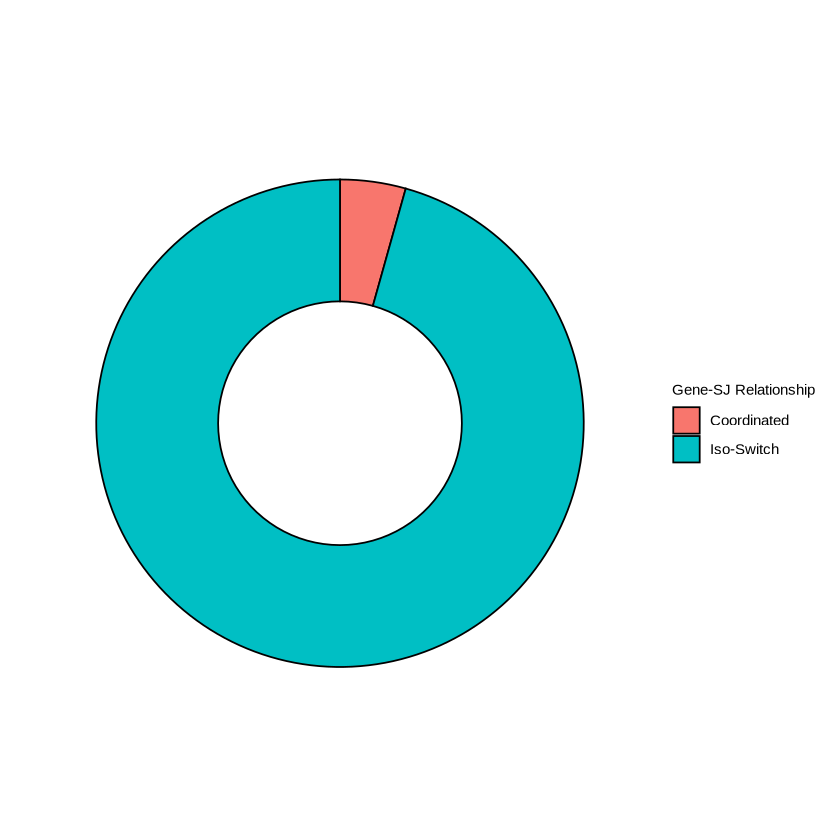

In [35]:
marvel <- IsoSwitch.10x(MarvelObject=marvel,
                        pval.sj=0.05,
                        delta.sj=1,
                        min.gene.norm=1.0,
                        pval.adj.gene=0.05,
                        log2fc.gene=0.5
                        )

marvel$SJ.Gene.Cor$Proportion$Plot

In [36]:
marvel$SJ.Gene.Cor$Proportion$Table

,sj.gene.cor,freq,pct
,<fct>,<int>,<dbl>
1,Coordinated,1,4.347826
2,Iso-Switch,22,95.652174


In [37]:
head(marvel$SJ.Gene.Cor$Data[,c("coord.intron", "gene_short_name", "cor.complete")], 10)

,coord.intron,gene_short_name,cor.complete
,<chr>,<chr>,<chr>
1,chr3:88228453:88228750,Cct3,Iso-Switch
2,chr9:78274577:78275002,Dppa5a,Iso-Switch
3,chr9:78386141:78386239,Eef1a1,Iso-Switch
4,chr10:111331967:111332614,Nap1l1,Iso-Switch
5,chr11:33102853:33103985,Npm1,Iso-Switch
6,chr11:114562683:114563090,Rpl38,Iso-Switch
7,chr2:73739052:73739527,Atp5mc3,Iso-Switch
8,chr10:127883674:127883867,Naca,Iso-Switch
9,chr10:127925028:127925887,Atp5f1b,Iso-Switch


All cells defined with coordinates found



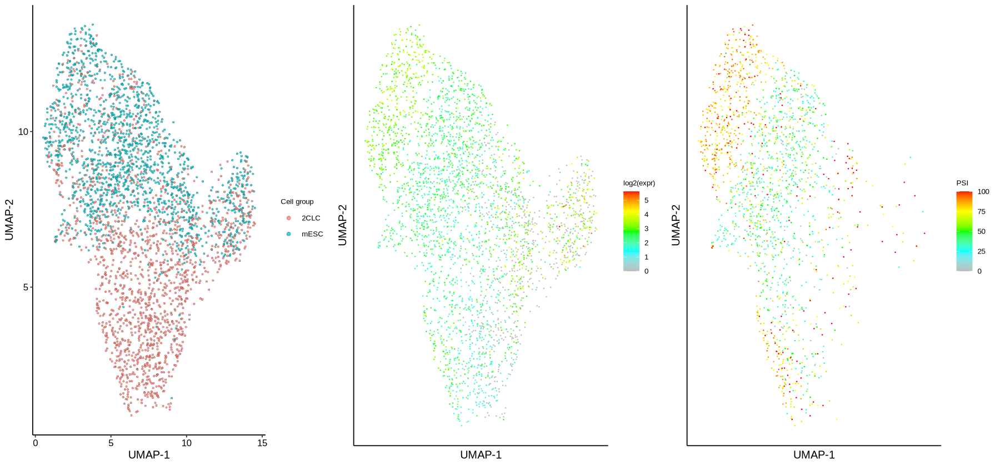

In [38]:
# Save into list
cell.group.list <- list("2CLC"=cell.ids.1,
                        "mESC"=cell.ids.2
                        )
    
# Plot cell groups
marvel <- PlotValues.PCA.CellGroup.10x(MarvelObject=marvel,
                                       cell.group.list=cell.group.list,
                                       legendtitle="Cell group",
                                       type="umap"
                                       )

plot_group <- marvel$adhocPlot$PCA$CellGroup

# Plot gene expression
marvel <- PlotValues.PCA.Gene.10x(MarvelObject=marvel,
                                  gene_short_name="Dppa5a",
                                  color.gradient=c("grey","cyan","green","yellow","red"),
                                  type="umap"
                                  )


plot_gene <- marvel$adhocPlot$PCA$Gene

# Plot PSI
marvel <- PlotValues.PCA.PSI.10x(MarvelObject=marvel,
                                 coord.intron="chr9:78274577:78275002",
                                 min.gene.count=3,
                                 log2.transform=FALSE,
                                 color.gradient=c("grey","cyan","green","yellow","red"),
                                 type="umap"
                                 )
 
plot_sj <- marvel$adhocPlot$PCA$PSI

# Increase width of plot
options(repr.plot.width=15)
# Increase size of the dots in the plot
plot_sj <- plot_sj +
    scale_size(range = c(0, 10))

# Arrange and view plots
grid.arrange(plot_group, plot_gene, plot_sj, nrow=1)

In [39]:
marvel <- BioPathways.10x(MarvelObject=marvel,
                          pval=0.05,
                          delta=1,
                          min.gene.norm=1.0,
                          method.adjust="fdr",
                          species="mouse"
                          )

head(marvel$DE$BioPathways$Table)

23 unique genes identified for GO analysis

'select()' returned 1:1 mapping between keys and columns



,ID,Description,GeneRatio,BgRatio,enrichment,RichFactor,FoldEnrichment,zScore,pvalue,p.adjust,qvalue,geneID,Count
,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<int>
GO:0140236,GO:0140236,translation at presynapse,8/22,47/28928,223.81431,0.17021277,223.81431,42.174985,8.137666e-18,1.984735e-15,1.075422e-15,Rpl38/Rpl35a/Rpl22/Rpl27a/Rpl12/Rpl9/Rpl5/Rpl23,8
GO:0140241,GO:0140241,translation at synapse,8/22,48/28928,219.15152,0.16666667,219.15152,41.730088,9.760994e-18,1.984735e-15,1.075422e-15,Rpl38/Rpl35a/Rpl22/Rpl27a/Rpl12/Rpl9/Rpl5/Rpl23,8
GO:0140242,GO:0140242,translation at postsynapse,8/22,48/28928,219.15152,0.16666667,219.15152,41.730088,9.760994e-18,1.984735e-15,1.075422e-15,Rpl38/Rpl35a/Rpl22/Rpl27a/Rpl12/Rpl9/Rpl5/Rpl23,8
GO:0050821,GO:0050821,protein stabilization,6/22,220/28928,35.86116,0.02727273,35.86116,14.319264,1.217948e-08,1.485896e-06,8.051275e-07,Cct3/Npm1/Calr/Cct5/Rpl5/Rpl23,6
GO:0022613,GO:0022613,ribonucleoprotein complex biogenesis,6/22,452/28928,17.45455,0.01327434,17.45455,9.727129,8.495825e-07,7.403505e-05,4.011562e-05,Npm1/Rpl38/Rpl35a/Eif2s2/Rps23/Rpl5,6
GO:1904667,GO:1904667,negative regulation of ubiquitin protein ligase activity,2/22,10/28928,262.98182,0.20000000,262.98182,22.858939,2.475318e-05,1.372676e-03,7.437798e-04,Rpl5/Rpl23,2


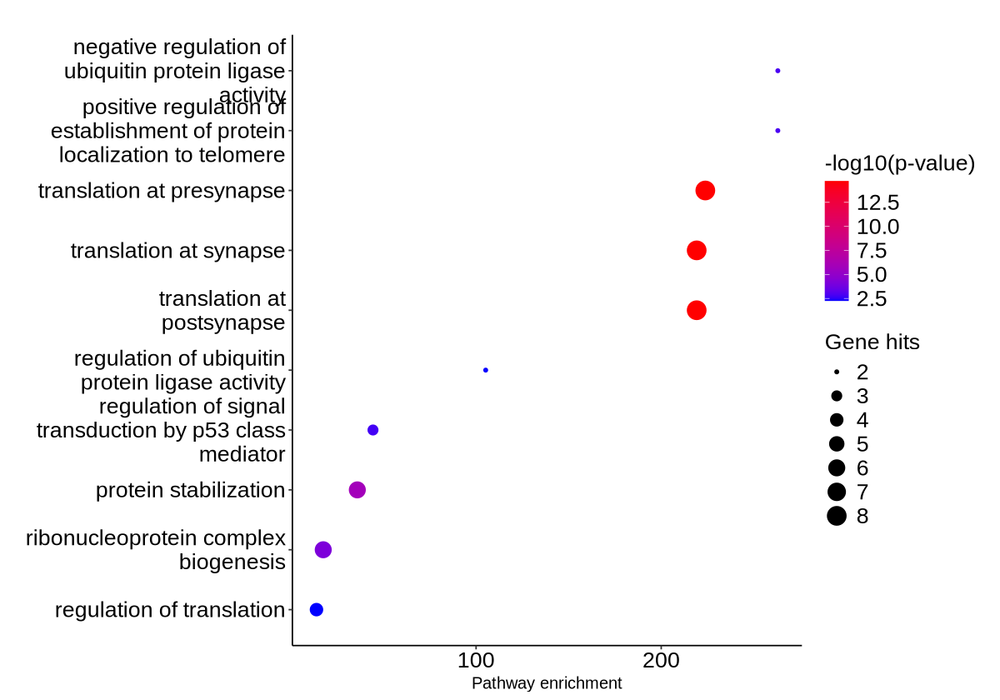

In [40]:
# Plot pathways related to cardiomyocyte development
marvel <- BioPathways.Plot.10x(MarvelObject=marvel,
                               marvel$DE$BioPathways$Table$Description[1:10],
                               y.label.size=8,
                               offset=0.5
                               )

options(repr.plot.width=10)

plot <- marvel$DE$BioPathways$Plot
plot <- plot +
    theme(axis.text.y = element_text(size = 16)) +
    theme(axis.text.x = element_text(size = 16)) +
    theme(legend.text = element_text(size = 16)) +
    theme(legend.title = element_text(size = 16))

plot

  [[ suppressing 32 column names ‘AAACAGGC_combined_5’, ‘AAAGCGGA_combined_5’, ‘AAAGGCTG_combined_5’ ... ]]

  [[ suppressing 32 column names ‘AAACAGGC_combined_5’, ‘AAAGCGGA_combined_5’, ‘AAAGGCTG_combined_5’ ... ]]

  [[ suppressing 32 column names ‘AAACAGGC_combined_5’, ‘AAAGCGGA_combined_5’, ‘AAAGGCTG_combined_5’ ... ]]

  [[ suppressing 32 column names ‘AAACAGGC_combined_5’, ‘AAAGCGGA_combined_5’, ‘AAAGGCTG_combined_5’ ... ]]

  [[ suppressing 32 column names ‘AAACAGGC_combined_5’, ‘AAAGCGGA_combined_5’, ‘AAAGGCTG_combined_5’ ... ]]



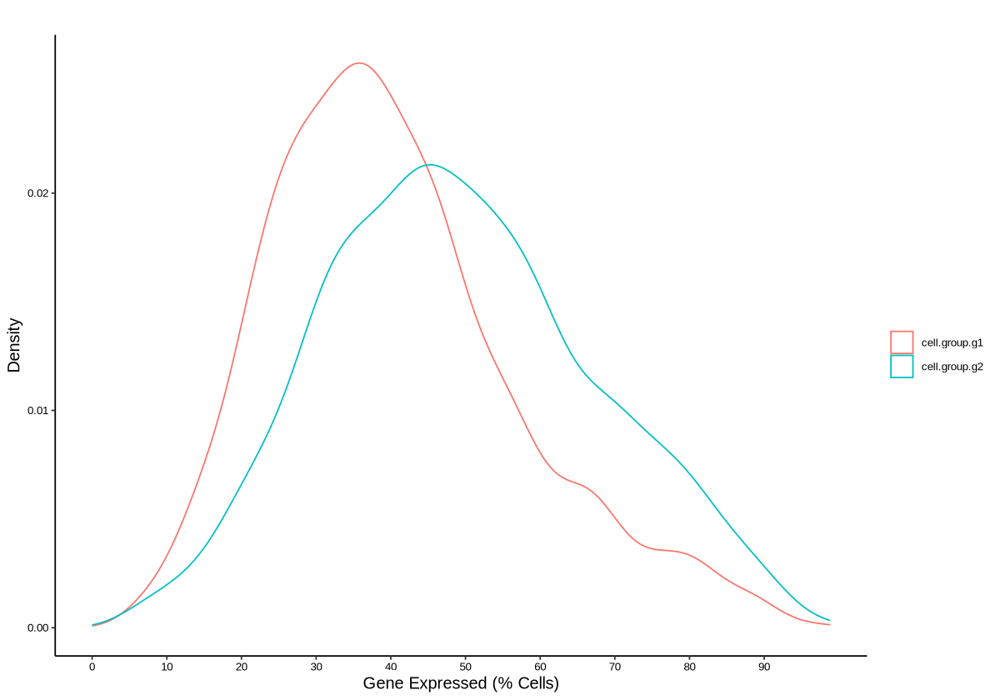

Warning message:
“Removed 690 rows containing missing values or values outside the scale range
(`geom_text_repel()`).”


$sample.metadata
                   cell.id       sample sample_type  barcode well_position
1      AAACAGGC_combined_5   combined_5    combined AAACAGGC           H18
2      AAAGCGGA_combined_5   combined_5    combined AAAGCGGA           P12
3      AAAGGCTG_combined_5   combined_5    combined AAAGGCTG           O10
4      AACACGCA_combined_5   combined_5    combined AACACGCA           L20
5      AACCCAAC_combined_5   combined_5    combined AACCCAAC           O15
6      AACCGCTT_combined_5   combined_5    combined AACCGCTT           I13
7      AACCGGAA_combined_5   combined_5    combined AACCGGAA           P14
8      AACCTGCT_combined_5   combined_5    combined AACCTGCT            O5
9      AACGAGGT_combined_5   combined_5    combined AACGAGGT            B9
10     AACTCTGG_combined_5   combined_5    combined AACTCTGG           P15
11     AAGACAGC_combined_5   combined_5    combined AAGACAGC            H5
12     AAGCACAT_combined_5   combined_5    combined AAGCACAT           B23
13     A

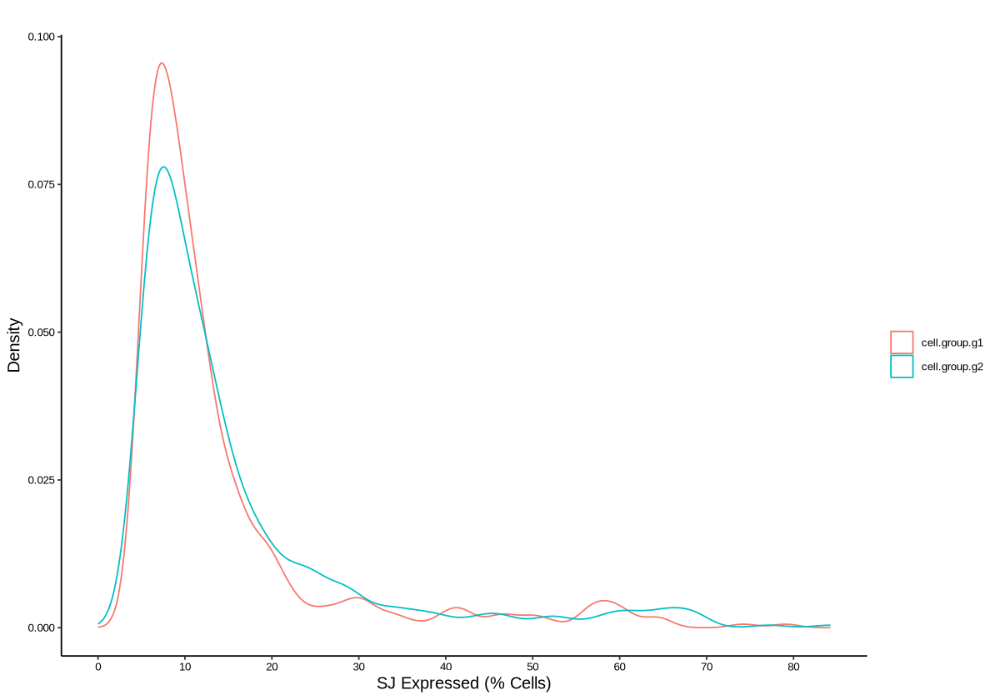

In [42]:
marvel